In [1]:
import pandas as pd
import numpy as np
import re
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import MaxNLocator
import seaborn as sb
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 300

In [2]:
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)

In [3]:
mov = pd.read_csv('movies_metadata.csv')
mov.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45466 entries, 0 to 45465
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45466 non-null  object 
 1   belongs_to_collection  4494 non-null   object 
 2   budget                 45466 non-null  object 
 3   genres                 45466 non-null  object 
 4   homepage               7782 non-null   object 
 5   id                     45466 non-null  object 
 6   imdb_id                45449 non-null  object 
 7   original_language      45455 non-null  object 
 8   original_title         45466 non-null  object 
 9   overview               44512 non-null  object 
 10  popularity             45461 non-null  object 
 11  poster_path            45080 non-null  object 
 12  production_companies   45463 non-null  object 
 13  production_countries   45463 non-null  object 
 14  release_date           45379 non-null  object 
 15  re

C:\Apps\Continuum\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (10) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


## Cleaning Dataset

### Profitable movies

Movies that have both a budget and a revenue number, and therefore profit can be calculated

In [4]:
# Create a copy to clean
movc = mov.copy()

In [5]:
movc.drop(['adult','belongs_to_collection','homepage','original_language','overview','popularity','poster_path',
           'production_countries','spoken_languages','status','tagline','video','vote_average','vote_count'], 
          axis=1, inplace=True)
movc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45466 entries, 0 to 45465
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                45466 non-null  object 
 1   genres                45466 non-null  object 
 2   id                    45466 non-null  object 
 3   imdb_id               45449 non-null  object 
 4   original_title        45466 non-null  object 
 5   production_companies  45463 non-null  object 
 6   release_date          45379 non-null  object 
 7   revenue               45460 non-null  float64
 8   runtime               45203 non-null  float64
 9   title                 45460 non-null  object 
dtypes: float64(2), object(8)
memory usage: 3.5+ MB


In [6]:
movc.budget.value_counts()

0                                   36573
5000000                               286
10000000                              259
20000000                              243
2000000                               242
15000000                              226
3000000                               223
25000000                              206
1000000                               197
30000000                              190
4000000                               181
6000000                               174
12000000                              172
40000000                              167
8000000                               155
500000                                142
35000000                              141
7000000                               137
50000000                              124
1500000                               120
60000000                              110
18000000                              105
3500000                               103
2500000                           

In [7]:
movc.revenue.value_counts()

0.000000e+00    38052
1.200000e+07       20
1.000000e+07       19
1.100000e+07       19
2.000000e+06       18
6.000000e+06       17
5.000000e+06       14
8.000000e+06       13
5.000000e+05       13
1.400000e+07       12
1.000000e+00       12
7.000000e+06       11
2.000000e+07       10
1.000000e+06       10
3.000000e+06       10
1.500000e+06        9
4.000000e+06        9
3.000000e+00        9
2.500000e+06        8
4.100000e+06        8
2.500000e+07        8
1.600000e+07        8
3.000000e+07        8
1.500000e+07        8
4.300000e+06        7
1.800000e+07        7
1.300000e+07        7
1.400000e+06        6
1.000000e+08        6
9.000000e+06        6
1.300000e+06        6
7.800000e+06        5
1.500000e+01        5
6.000000e+07        5
5.900000e+06        5
4.500000e+06        5
2.200000e+07        5
5.000000e+00        5
2.800000e+07        5
2.500000e+01        5
8.000000e+00        5
1.600000e+06        5
1.700000e+07        5
1.020000e+08        5
1.900000e+07        5
2.400000e+

In [8]:
# budget contains text - remove!
movc = movc[~movc['budget'].str.contains('[A-Za-z]')]
movc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45463 entries, 0 to 45465
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                45463 non-null  object 
 1   genres                45463 non-null  object 
 2   id                    45463 non-null  object 
 3   imdb_id               45446 non-null  object 
 4   original_title        45463 non-null  object 
 5   production_companies  45460 non-null  object 
 6   release_date          45376 non-null  object 
 7   revenue               45460 non-null  float64
 8   runtime               45203 non-null  float64
 9   title                 45460 non-null  object 
dtypes: float64(2), object(8)
memory usage: 3.8+ MB


In [9]:
# convert revenue to int
movc['budget'] = movc['budget'].astype(np.int64)
movc['revenue'] = movc['revenue'].fillna(0.0).astype(np.int64)
movc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45463 entries, 0 to 45465
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                45463 non-null  int64  
 1   genres                45463 non-null  object 
 2   id                    45463 non-null  object 
 3   imdb_id               45446 non-null  object 
 4   original_title        45463 non-null  object 
 5   production_companies  45460 non-null  object 
 6   release_date          45376 non-null  object 
 7   revenue               45463 non-null  int64  
 8   runtime               45203 non-null  float64
 9   title                 45460 non-null  object 
dtypes: float64(1), int64(2), object(7)
memory usage: 3.8+ MB


In [10]:
# remove rows in rev and budg which are 0
movc = movc.replace(0, np.nan)
movc = movc.dropna(subset=['budget', 'revenue'])
movc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5381 entries, 0 to 45422
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                5381 non-null   float64
 1   genres                5381 non-null   object 
 2   id                    5381 non-null   object 
 3   imdb_id               5381 non-null   object 
 4   original_title        5381 non-null   object 
 5   production_companies  5381 non-null   object 
 6   release_date          5381 non-null   object 
 7   revenue               5381 non-null   float64
 8   runtime               5369 non-null   float64
 9   title                 5381 non-null   object 
dtypes: float64(3), object(7)
memory usage: 462.4+ KB


In [11]:
# Welcome to Dongmakgol film has budget of 8 instead of 8,000,000
movc[(movc['title'] == "Welcome to Dongmakgol")]

,budget,genres,id,imdb_id,original_title,production_companies,release_date,revenue,runtime,title
14372,8.0,"[{'id': 10752, 'name': 'War'}, {'id': 35, 'name': 'Comedy'}, {'id': 18, 'name': 'Drama'}, {'id': 36, 'name': 'History'}]",14968,tt0475783,웰컴 투 동막골,"[{'name': 'Film It Suda', 'id': 5659}]",2005-08-04,33579813.0,133.0,Welcome to Dongmakgol


In [12]:
movc.loc[(movc['title'] == "Welcome to Dongmakgol"), ['budget']] = 8000000
movc[(movc['title'] == "Welcome to Dongmakgol")]

,budget,genres,id,imdb_id,original_title,production_companies,release_date,revenue,runtime,title
14372,8000000.0,"[{'id': 10752, 'name': 'War'}, {'id': 35, 'name': 'Comedy'}, {'id': 18, 'name': 'Drama'}, {'id': 36, 'name': 'History'}]",14968,tt0475783,웰컴 투 동막골,"[{'name': 'Film It Suda', 'id': 5659}]",2005-08-04,33579813.0,133.0,Welcome to Dongmakgol


In [13]:
# Paranormal Activity film has a budget of 15,000 instead of 215,000
movc[(movc['title'] == "Paranormal Activity")]

,budget,genres,id,imdb_id,original_title,production_companies,release_date,revenue,runtime,title
14192,15000.0,"[{'id': 27, 'name': 'Horror'}, {'id': 9648, 'name': 'Mystery'}]",23827,tt1179904,Paranormal Activity,"[{'name': 'Blumhouse Productions', 'id': 3172}, {'name': 'Solana Films', 'id': 21223}]",2007-09-14,193355800.0,86.0,Paranormal Activity


In [14]:
movc.loc[(movc['title'] == "Paranormal Activity"), ['budget']] = 215000
movc[(movc['title'] == "Paranormal Activity")]

,budget,genres,id,imdb_id,original_title,production_companies,release_date,revenue,runtime,title
14192,215000.0,"[{'id': 27, 'name': 'Horror'}, {'id': 9648, 'name': 'Mystery'}]",23827,tt1179904,Paranormal Activity,"[{'name': 'Blumhouse Productions', 'id': 3172}, {'name': 'Solana Films', 'id': 21223}]",2007-09-14,193355800.0,86.0,Paranormal Activity


In [15]:
# create profit column
movc['profit'] = movc['revenue'] - movc['budget']
movc = movc.reset_index(drop=True)

In [16]:
movc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5381 entries, 0 to 5380
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                5381 non-null   float64
 1   genres                5381 non-null   object 
 2   id                    5381 non-null   object 
 3   imdb_id               5381 non-null   object 
 4   original_title        5381 non-null   object 
 5   production_companies  5381 non-null   object 
 6   release_date          5381 non-null   object 
 7   revenue               5381 non-null   float64
 8   runtime               5369 non-null   float64
 9   title                 5381 non-null   object 
 10  profit                5381 non-null   float64
dtypes: float64(4), object(7)
memory usage: 462.6+ KB


**From 45,466 to 5,381 due to rows without budget or revenue numbers! Loss of 40,085 rows of data!!**

### Genre list of movies

In [17]:
# Create a copy to clean
movg = movc.copy()
movg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5381 entries, 0 to 5380
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                5381 non-null   float64
 1   genres                5381 non-null   object 
 2   id                    5381 non-null   object 
 3   imdb_id               5381 non-null   object 
 4   original_title        5381 non-null   object 
 5   production_companies  5381 non-null   object 
 6   release_date          5381 non-null   object 
 7   revenue               5381 non-null   float64
 8   runtime               5369 non-null   float64
 9   title                 5381 non-null   object 
 10  profit                5381 non-null   float64
dtypes: float64(4), object(7)
memory usage: 462.6+ KB


In [18]:
# keep only first genre
movg['genres'] = movg['genres'].str.split("}", expand=True)[0]

In [19]:
# remove remaining unnecessary text
movg['genres'] = movg['genres'].str.split("name", expand=True)[1]
movg['genres'] = movg['genres'].str.split(": ", expand=True)[1]
movg['genres'] = movg['genres'].str[:-1]
movg['genres'] = movg['genres'].str[1:]
movg.genres.value_counts()

Drama              1316
Comedy             1067
Action              961
Adventure           416
Horror              325
Crime               267
Thriller            199
Animation           146
Fantasy             140
Romance             121
Science Fiction     104
Mystery              67
Family               55
Documentary          48
War                  38
Music                34
Western              31
History              29
Foreign               4
TV Movie              1
Name: genres, dtype: int64

In [20]:
# remove null values
movg = movg.dropna(subset=['genres'])
movg.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5369 entries, 0 to 5380
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                5369 non-null   float64
 1   genres                5369 non-null   object 
 2   id                    5369 non-null   object 
 3   imdb_id               5369 non-null   object 
 4   original_title        5369 non-null   object 
 5   production_companies  5369 non-null   object 
 6   release_date          5369 non-null   object 
 7   revenue               5369 non-null   float64
 8   runtime               5358 non-null   float64
 9   title                 5369 non-null   object 
 10  profit                5369 non-null   float64
dtypes: float64(4), object(7)
memory usage: 503.3+ KB


**Only first genre kept as considered primary genre!**

### Clean production company

In [21]:
movp = movg.copy()
movp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5369 entries, 0 to 5380
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                5369 non-null   float64
 1   genres                5369 non-null   object 
 2   id                    5369 non-null   object 
 3   imdb_id               5369 non-null   object 
 4   original_title        5369 non-null   object 
 5   production_companies  5369 non-null   object 
 6   release_date          5369 non-null   object 
 7   revenue               5369 non-null   float64
 8   runtime               5358 non-null   float64
 9   title                 5369 non-null   object 
 10  profit                5369 non-null   float64
dtypes: float64(4), object(7)
memory usage: 503.3+ KB


In [22]:
movpb = movp.copy()

In [23]:
movp.production_companies.value_counts()

[]                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

In [24]:
# keep only first genre
movp['production_companies'] = movp['production_companies'].str.split(",", expand=True)[0]

In [25]:
# remove remaining unnecessary text
movp['production_companies'] = movp['production_companies'].str.split(": ", expand=True)[1]
movp['production_companies'] = movp['production_companies'].str[:-1]
movp['production_companies'] = movp['production_companies'].str[1:]
movp.production_companies.value_counts()

Paramount Pictures                                                           336
Universal Pictures                                                           329
Twentieth Century Fox Film Corporation                                       247
Columbia Pictures                                                            209
New Line Cinema                                                              164
Walt Disney Pictures                                                         131
Warner Bros.                                                                 117
Miramax Films                                                                 88
United Artists                                                                87
Columbia Pictures Corporation                                                 83
Metro-Goldwyn-Mayer (MGM)                                                     83
Village Roadshow Pictures                                                     72
TriStar Pictures            

In [26]:
# remove null values
movp = movp.dropna(subset=['production_companies'])
movp = movp.reset_index(drop=True)
movp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5199 entries, 0 to 5198
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                5199 non-null   float64
 1   genres                5199 non-null   object 
 2   id                    5199 non-null   object 
 3   imdb_id               5199 non-null   object 
 4   original_title        5199 non-null   object 
 5   production_companies  5199 non-null   object 
 6   release_date          5199 non-null   object 
 7   revenue               5199 non-null   float64
 8   runtime               5193 non-null   float64
 9   title                 5199 non-null   object 
 10  profit                5199 non-null   float64
dtypes: float64(4), object(7)
memory usage: 446.9+ KB


**Only first production company kept as considered primary production company!**

In [27]:
# clean duplicate production names of major companies
movp.loc[movp['production_companies'].str.contains('Walt Disney'), 'production_companies'] = 'Walt Disney'
movp.loc[movp['production_companies'].str.contains('DreamWorks'), 'production_companies'] = 'DreamWorks'
movp.loc[movp['production_companies'].str.contains('Fox'), 'production_companies'] = 'Twentieth Century Fox'
movp.loc[movp['production_companies'].str.contains('Universal'), 'production_companies'] = 'Universal'
movp.loc[movp['production_companies'].str.contains('Columbia'), 'production_companies'] = 'Columbia'

In [28]:
movp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5199 entries, 0 to 5198
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                5199 non-null   float64
 1   genres                5199 non-null   object 
 2   id                    5199 non-null   object 
 3   imdb_id               5199 non-null   object 
 4   original_title        5199 non-null   object 
 5   production_companies  5199 non-null   object 
 6   release_date          5199 non-null   object 
 7   revenue               5199 non-null   float64
 8   runtime               5193 non-null   float64
 9   title                 5199 non-null   object 
 10  profit                5199 non-null   float64
dtypes: float64(4), object(7)
memory usage: 446.9+ KB


### Clean runtime

In [29]:
movr = movp.copy()
movr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5199 entries, 0 to 5198
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                5199 non-null   float64
 1   genres                5199 non-null   object 
 2   id                    5199 non-null   object 
 3   imdb_id               5199 non-null   object 
 4   original_title        5199 non-null   object 
 5   production_companies  5199 non-null   object 
 6   release_date          5199 non-null   object 
 7   revenue               5199 non-null   float64
 8   runtime               5193 non-null   float64
 9   title                 5199 non-null   object 
 10  profit                5199 non-null   float64
dtypes: float64(4), object(7)
memory usage: 446.9+ KB


In [30]:
movr = movr.dropna(subset=['runtime'])

In [31]:
movr['runtime'] = movr['runtime'].astype(np.int64)
movr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5193 entries, 0 to 5198
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                5193 non-null   float64
 1   genres                5193 non-null   object 
 2   id                    5193 non-null   object 
 3   imdb_id               5193 non-null   object 
 4   original_title        5193 non-null   object 
 5   production_companies  5193 non-null   object 
 6   release_date          5193 non-null   object 
 7   revenue               5193 non-null   float64
 8   runtime               5193 non-null   int64  
 9   title                 5193 non-null   object 
 10  profit                5193 non-null   float64
dtypes: float64(3), int64(1), object(7)
memory usage: 486.8+ KB


### Clean release date

In [32]:
movd = movr.copy()
movd.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5193 entries, 0 to 5198
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                5193 non-null   float64
 1   genres                5193 non-null   object 
 2   id                    5193 non-null   object 
 3   imdb_id               5193 non-null   object 
 4   original_title        5193 non-null   object 
 5   production_companies  5193 non-null   object 
 6   release_date          5193 non-null   object 
 7   revenue               5193 non-null   float64
 8   runtime               5193 non-null   int64  
 9   title                 5193 non-null   object 
 10  profit                5193 non-null   float64
dtypes: float64(3), int64(1), object(7)
memory usage: 486.8+ KB


In [33]:
# Change timestamp data type
movd['release_date'] = pd.to_datetime(movd['release_date'])
movd.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5193 entries, 0 to 5198
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   budget                5193 non-null   float64       
 1   genres                5193 non-null   object        
 2   id                    5193 non-null   object        
 3   imdb_id               5193 non-null   object        
 4   original_title        5193 non-null   object        
 5   production_companies  5193 non-null   object        
 6   release_date          5193 non-null   datetime64[ns]
 7   revenue               5193 non-null   float64       
 8   runtime               5193 non-null   int64         
 9   title                 5193 non-null   object        
 10  profit                5193 non-null   float64       
dtypes: datetime64[ns](1), float64(3), int64(1), object(6)
memory usage: 486.8+ KB


In [34]:
# create month column
movd['release_month'] = pd.DatetimeIndex(movd['release_date']).month
movd.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5193 entries, 0 to 5198
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   budget                5193 non-null   float64       
 1   genres                5193 non-null   object        
 2   id                    5193 non-null   object        
 3   imdb_id               5193 non-null   object        
 4   original_title        5193 non-null   object        
 5   production_companies  5193 non-null   object        
 6   release_date          5193 non-null   datetime64[ns]
 7   revenue               5193 non-null   float64       
 8   runtime               5193 non-null   int64         
 9   title                 5193 non-null   object        
 10  profit                5193 non-null   float64       
 11  release_month         5193 non-null   int64         
dtypes: datetime64[ns](1), float64(3), int64(2), object(6)
memory usage: 527.4+ K

### 10 most profitable movies in each movie genre in an individual dataframe

In [35]:
movv = movd.copy()
movv.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5193 entries, 0 to 5198
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   budget                5193 non-null   float64       
 1   genres                5193 non-null   object        
 2   id                    5193 non-null   object        
 3   imdb_id               5193 non-null   object        
 4   original_title        5193 non-null   object        
 5   production_companies  5193 non-null   object        
 6   release_date          5193 non-null   datetime64[ns]
 7   revenue               5193 non-null   float64       
 8   runtime               5193 non-null   int64         
 9   title                 5193 non-null   object        
 10  profit                5193 non-null   float64       
 11  release_month         5193 non-null   int64         
dtypes: datetime64[ns](1), float64(3), int64(2), object(6)
memory usage: 527.4+ K

In [36]:
movv['genres'] = movv['genres'].replace({'Science Fiction': 'SciFi'})
movv['genres'] = movv['genres'].replace({'TV Movie': 'TV'})

In [37]:
for name in movv.genres.unique():
    globals()[name] = movv.loc[movv.genres == name]
    globals()[name] = globals()[name].sort_values(by=['profit'], ascending=False).reset_index(drop=True)
    globals()[name] = globals()[name].iloc[:10]
    print (name)

Animation
Adventure
Comedy
Action
History
Drama
Crime
Fantasy
SciFi
Horror
Romance
Mystery
Thriller
Documentary
Family
War
Western
Music
TV
Foreign


## EDA

In [38]:
# for simple charting, the below function renames axis and titles which will be called regularly
def pltlab(title,x_label,y_label):
    plt.title(title, fontsize=20, fontweight='bold')
    plt.xlabel(x_label, fontsize=18)
    plt.ylabel(y_label, fontsize=18)
matplotlib.rcParams.update({'font.size': 14})

### Prevailing production company of each movie genre

Prevailing production company of the 10 most profitable movies in each movie genre (Drama, Comedy, Thriller, Romance, Action, Horror, Documentary, Crime, Adventure, Science Fiction, Family, Mystery, Fantasy, Music, Animation, War, History, Western, TV Movie, Foreign)

In [39]:
# concat top 10 profitable films per genre
prevprod = pd.concat([Animation, Adventure, Comedy, Action, History, Drama, Crime, Fantasy, SciFi, Horror, Romance, Mystery, 
                      Thriller, Documentary, Family, War, Western, Music, TV, Foreign])

In [40]:
prevprod.sort_values(by=['genres','production_companies'], ascending=True)

,budget,genres,id,imdb_id,original_title,production_companies,release_date,revenue,runtime,title,profit,release_month
9,200000000.0,Action,37724,tt1074638,Skyfall,Columbia,2012-10-25,1.108561e+09,143,Skyfall,9.085610e+08,10
7,80000000.0,Action,324852,tt3469046,Despicable Me 3,Illumination Entertainment,2017-06-15,1.020063e+09,96,Despicable Me 3,9.400634e+08,6
0,237000000.0,Action,19995,tt0499549,Avatar,Ingenious Film Partners,2009-12-10,2.787965e+09,162,Avatar,2.550965e+09,12
1,245000000.0,Action,140607,tt2488496,Star Wars: The Force Awakens,Lucasfilm,2015-12-15,2.068224e+09,136,Star Wars: The Force Awakens,1.823224e+09,12
4,280000000.0,Action,99861,tt2395427,Avengers: Age of Ultron,Marvel Studios,2015-04-22,1.405404e+09,141,Avengers: Age of Ultron,1.125404e+09,4
5,200000000.0,Action,68721,tt1300854,Iron Man 3,Marvel Studios,2013-04-18,1.215440e+09,130,Iron Man 3,1.015440e+09,4
8,195000000.0,Action,38356,tt1399103,Transformers: Dark of the Moon,Paramount Pictures,2011-06-28,1.123747e+09,154,Transformers: Dark of the Moon,9.287470e+08,6
2,150000000.0,Action,135397,tt0369610,Jurassic World,Universal,2015-06-09,1.513529e+09,124,Jurassic World,1.363529e+09,6
3,190000000.0,Action,168259,tt2820852,Furious 7,Universal,2015-04-01,1.506249e+09,137,Furious 7,1.316249e+09,4
6,250000000.0,Action,337339,tt4630562,The Fate of the Furious,Universal,2017-04-12,1.238765e+09,136,The Fate of the Furious,9.887648e+08,4


In [88]:
prevprod.sort_values(by=['profit'], ascending=True)

,budget,genres,id,imdb_id,original_title,production_companies,release_date,revenue,runtime,title,profit,release_month
3,225000.0,Foreign,139948,tt1781784,Burn,Apostle Productions,2012-11-01,1.113000e+05,86,Burn,-1.137000e+05,11
2,22361.0,Foreign,96239,tt1810861,Zombadings 1: Patayin sa Shokot si Remington,Reality Entertainment,2011-08-31,7.216510e+05,96,Remington and the Curse of the Zombadings,6.992900e+05,8
1,750000.0,Foreign,15979,tt1267500,Phoonk,One More Thought Entertainment,2008-08-22,2.760000e+06,179,Phoonk,2.010000e+06,8
9,5500000.0,Western,11901,tt0068699,High Plains Drifter,Universal,1973-04-19,1.570000e+07,105,High Plains Drifter,1.020000e+07,4
9,4317946.0,Documentary,57276,tt1440266,Pina,Neue Road Movies,2011-02-24,1.462483e+07,106,Pina,1.030688e+07,2
8,200000.0,Western,391,tt0058461,Per un pugno di dollari,United Artists,1964-09-12,1.450000e+07,99,A Fistful of Dollars,1.430000e+07,9
6,600000.0,Western,938,tt0059578,Per qualche dollaro in più,Constantin Film Produktion,1965-12-18,1.500000e+07,132,For a Few Dollars More,1.440000e+07,12
7,6000000.0,Western,32275,tt0038499,Duel in the Sun,The Selznik Studio,1946-12-31,2.040000e+07,144,Duel in the Sun,1.440000e+07,12
0,7400000.0,Foreign,66526,tt0220656,முதல்வன்,S Pictures,1999-11-07,2.200000e+07,169,Mudhalvan,1.460000e+07,11
5,55000000.0,Western,5176,tt0381849,3:10 to Yuma,Tree Line Films,2007-09-06,7.001622e+07,122,3:10 to Yuma,1.501622e+07,9


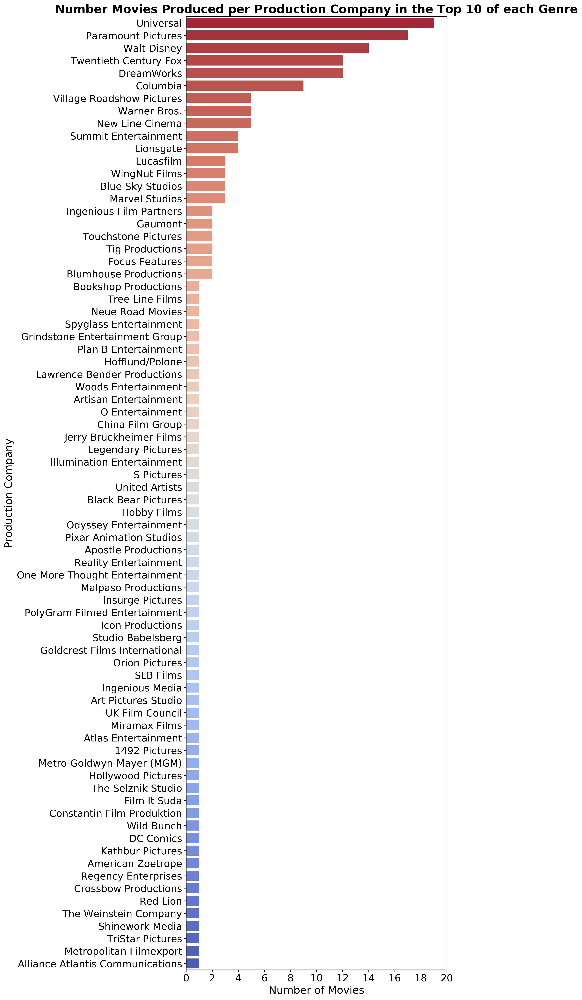

In [41]:
# plot overall number of films produced by production company from the top 10 profitable films per genre
plt.figure(figsize=[8, 30])
ax = sb.countplot(data=prevprod,y='production_companies',order=prevprod.production_companies.value_counts().index,
                  palette="coolwarm_r")
plt.xlim([0, 20])
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
plt.tick_params('y', labelsize='large')
plt.tick_params('x', labelsize='large')
pltlab('Number Movies Produced per Production Company in the Top 10 of each Genre','Number of Movies','Production Company')

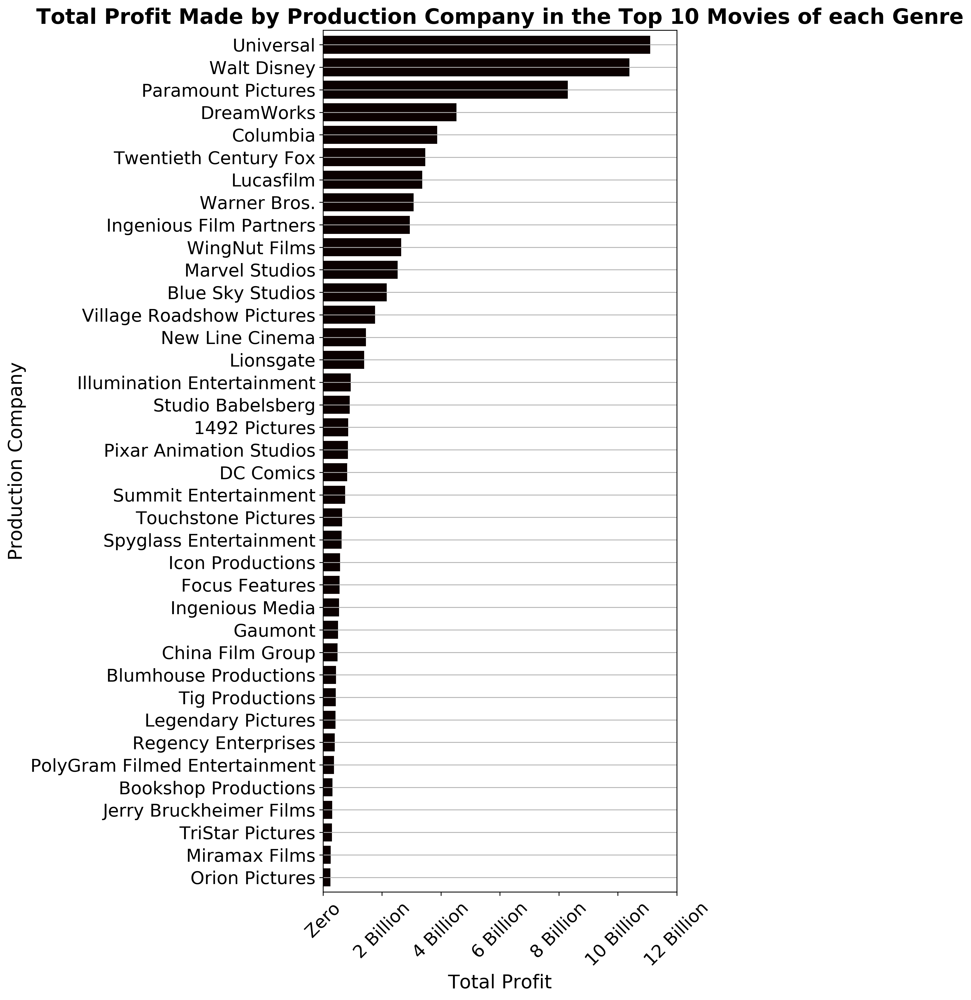

In [42]:
# plot sum of profit of films produced by production company from the top 10 profitable films per genre
prodprof = prevprod.groupby(['production_companies']).sum()['profit'].reset_index()
prodprof = prodprof.set_index('production_companies')
prodprof = prodprof.sort_values(by=['profit'], ascending=[True])

# get top half
prodprofs = prodprof.iloc[-38:]

# plot
prodprofs.plot.barh(figsize=(6, 15), legend=None, cmap="hot", width=0.8)
plt.xlim(0,12000000000)
plt.xticks([0, 2000000000, 4000000000, 6000000000, 8000000000, 10000000000, 12000000000],
           ["Zero","2 Billion","4 Billion","6 Billion","8 Billion","10 Billion","12 Billion"],size='large', rotation=45)
plt.tick_params('y', labelsize='large')
plt.grid(axis='y')
pltlab('Total Profit Made by Production Company in the Top 10 Movies of each Genre','Total Profit','Production Company')

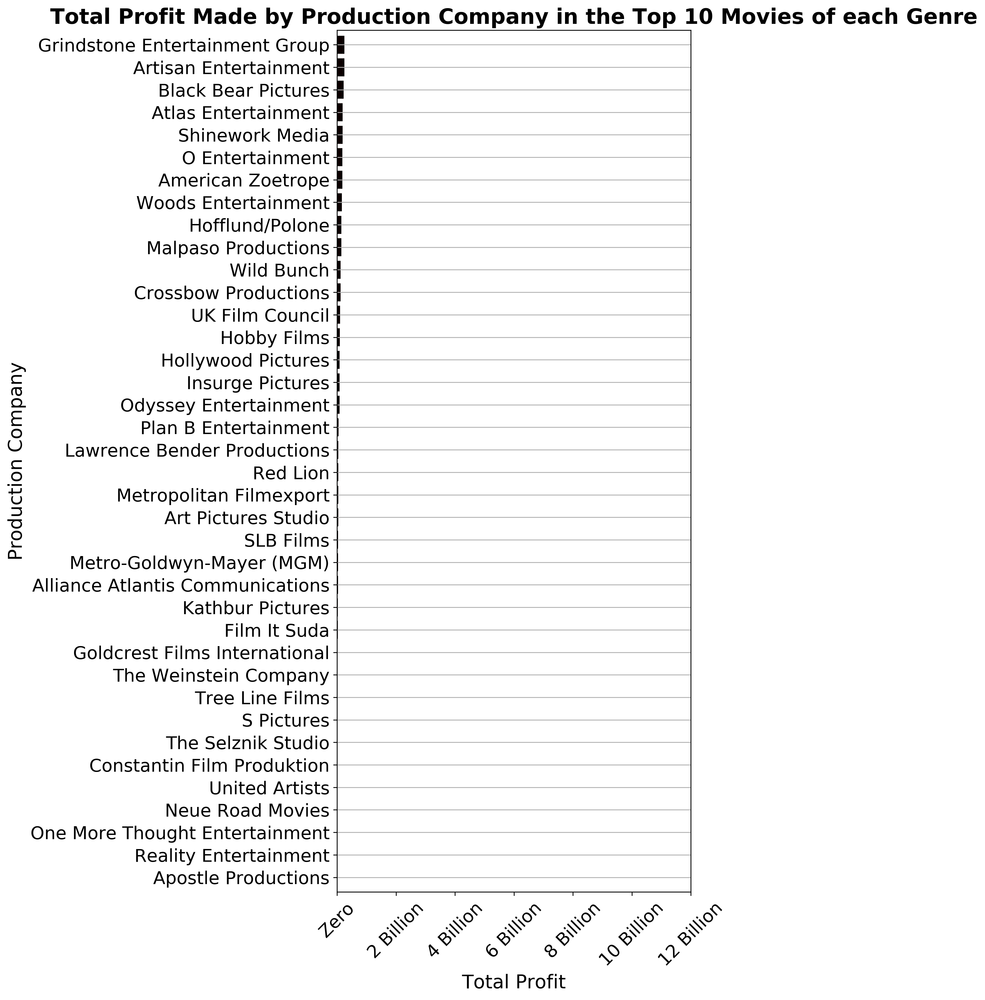

In [43]:
# get bottom half
prodprofs = prodprof.iloc[:38]

# plot
prodprofs.plot.barh(figsize=(6, 15), legend=None, cmap="hot", width=0.8)
plt.xlim(0,12000000000)
plt.xticks([0, 2000000000, 4000000000, 6000000000, 8000000000, 10000000000, 12000000000],
           ["Zero","2 Billion","4 Billion","6 Billion","8 Billion","10 Billion","12 Billion"],size='large', rotation=45)
plt.tick_params('y', labelsize='large')
plt.grid(axis='y')
pltlab('Total Profit Made by Production Company in the Top 10 Movies of each Genre','Total Profit','Production Company')

In [44]:
prodc = prevprod.groupby(['genres', 'production_companies']).sum()['profit'].reset_index()
prodc.sort_values(by=['genres','profit'], ascending=[True,False]).reset_index(drop=True)

,genres,production_companies,profit
0,Action,Universal,3.668543e+09
1,Action,Ingenious Film Partners,2.550965e+09
2,Action,Marvel Studios,2.140844e+09
3,Action,Lucasfilm,1.823224e+09
4,Action,Illumination Entertainment,9.400634e+08
5,Action,Paramount Pictures,9.287470e+08
6,Action,Columbia,9.085610e+08
7,Adventure,WingNut Films,2.650545e+09
8,Adventure,Walt Disney,1.694231e+09
9,Adventure,Studio Babelsberg,9.033045e+08


In [45]:
prodfin = prodc.groupby(['genres']).max()[['production_companies','profit']].reset_index()
prodfin['production_companies']

0                     Universal
1                 WingNut Films
2                   Walt Disney
3                     Universal
4           Woods Entertainment
5                    Wild Bunch
6                  Warner Bros.
7                  Warner Bros.
8                   Walt Disney
9                    S Pictures
10                    Universal
11                    Universal
12                 Warner Bros.
13        Twentieth Century Fox
14                  Walt Disney
15                 Warner Bros.
16                    Universal
17    Village Roadshow Pictures
18    Village Roadshow Pictures
19                    Universal
Name: production_companies, dtype: object

In [46]:
# count film per prod comp
count = prevprod.groupby(['genres', 'production_companies']).count().reset_index()
count

,genres,production_companies,budget,id,imdb_id,original_title,release_date,revenue,runtime,title,profit,release_month
0,Action,Columbia,1,1,1,1,1,1,1,1,1,1
1,Action,Illumination Entertainment,1,1,1,1,1,1,1,1,1,1
2,Action,Ingenious Film Partners,1,1,1,1,1,1,1,1,1,1
3,Action,Lucasfilm,1,1,1,1,1,1,1,1,1,1
4,Action,Marvel Studios,2,2,2,2,2,2,2,2,2,2
5,Action,Paramount Pictures,1,1,1,1,1,1,1,1,1,1
6,Action,Universal,3,3,3,3,3,3,3,3,3,3
7,Adventure,1492 Pictures,1,1,1,1,1,1,1,1,1,1
8,Adventure,Lucasfilm,1,1,1,1,1,1,1,1,1,1
9,Adventure,Studio Babelsberg,1,1,1,1,1,1,1,1,1,1


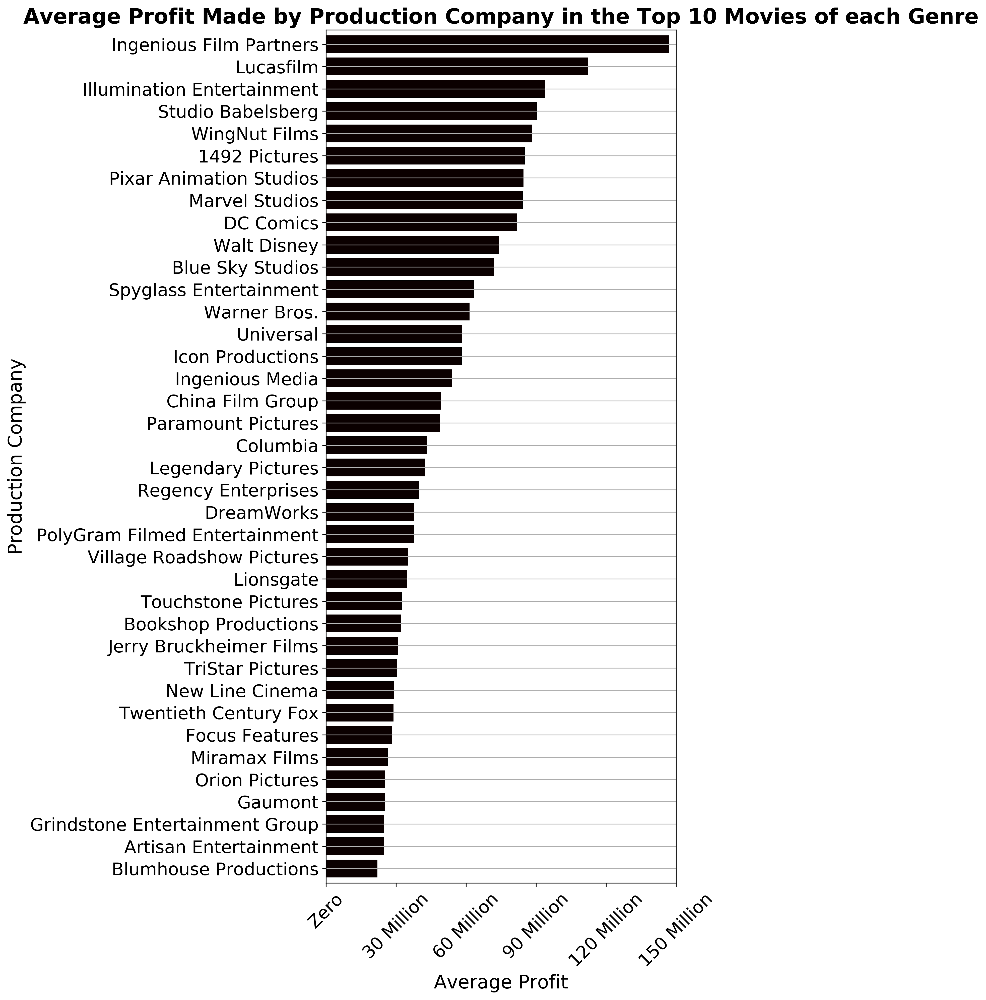

In [47]:
# plot sum of profit of films produced by production company from the top 10 profitable films per genre
prodmean = prevprod.groupby(['production_companies']).mean()['profit'].reset_index()
prodmean = prodmean.set_index('production_companies')
prodmean = prodmean.sort_values(by=['profit'], ascending=[True])

# get top half
prodmeans = prodmean.iloc[-38:]

# plot
prodmeans.plot.barh(figsize=(6, 15), legend=None, cmap="hot", width=0.8)
plt.xlim(0,1500000000)
plt.xticks([0, 300000000, 600000000, 900000000, 1200000000, 1500000000],
           ["Zero","30 Million","60 Million","90 Million","120 Million","150 Million"],size='large', rotation=45)
plt.tick_params('y', labelsize='large')
plt.grid(axis='y')
pltlab('Average Profit Made by Production Company in the Top 10 Movies of each Genre','Average Profit','Production Company')

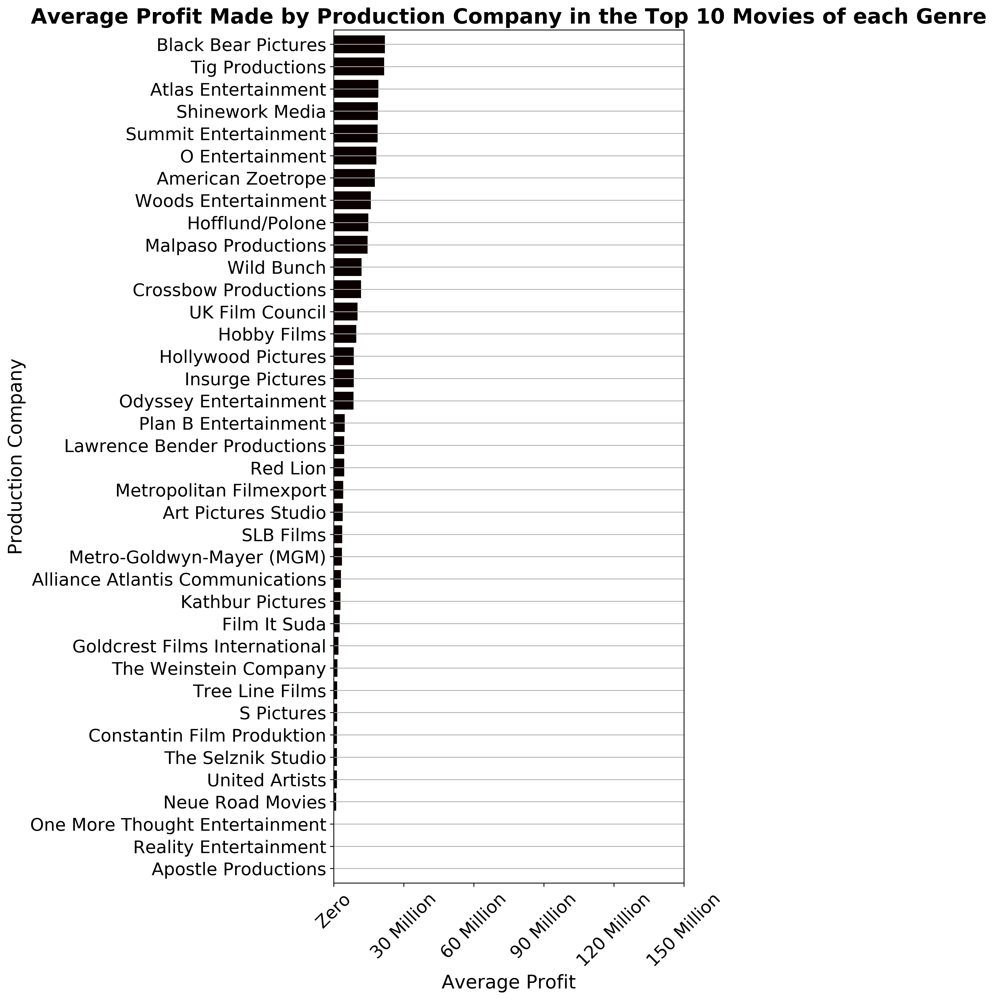

In [48]:
# get bottom half
prodmeans = prodmean.iloc[:38]

# plot
prodmeans.plot.barh(figsize=(6, 15), legend=None, cmap="hot", width=0.8)
plt.xlim(0,1500000000)
plt.xticks([0, 300000000, 600000000, 900000000, 1200000000, 1500000000],
           ["Zero","30 Million","60 Million","90 Million","120 Million","150 Million"],size='large', rotation=45)
plt.tick_params('y', labelsize='large')
plt.grid(axis='y')
pltlab('Average Profit Made by Production Company in the Top 10 Movies of each Genre','Average Profit','Production Company')

In [49]:
prodm = prevprod.groupby(['genres', 'production_companies']).mean()['profit'].reset_index()
prodm.sort_values(by=['genres','profit'], ascending=[True,False]).reset_index(drop=True)

,genres,production_companies,profit
0,Action,Ingenious Film Partners,2.550965e+09
1,Action,Lucasfilm,1.823224e+09
2,Action,Universal,1.222848e+09
3,Action,Marvel Studios,1.070422e+09
4,Action,Illumination Entertainment,9.400634e+08
5,Action,Paramount Pictures,9.287470e+08
6,Action,Columbia,9.085610e+08
7,Adventure,Studio Babelsberg,9.033045e+08
8,Adventure,WingNut Films,8.835149e+08
9,Adventure,Universal,8.571000e+08


In [50]:
prodmeana = prodm.groupby(['genres'])['profit'].max().reset_index()
prodmeana = prodmeana.merge(prodm)
prodmeana['production_companies']

0       Ingenious Film Partners
1             Studio Babelsberg
2                   Walt Disney
3            Paramount Pictures
4         Twentieth Century Fox
5                    Wild Bunch
6            Paramount Pictures
7                  Warner Bros.
8                      Columbia
9                    S Pictures
10      Jerry Bruckheimer Films
11                    Universal
12          Touchstone Pictures
13       Spyglass Entertainment
14          Touchstone Pictures
15           Paramount Pictures
16                    Universal
17                     Columbia
18    Village Roadshow Pictures
19          Regency Enterprises
Name: production_companies, dtype: object

In [51]:
# count film per prod comp
count = prevprod.groupby(['genres', 'production_companies']).count().reset_index()
count

,genres,production_companies,budget,id,imdb_id,original_title,release_date,revenue,runtime,title,profit,release_month
0,Action,Columbia,1,1,1,1,1,1,1,1,1,1
1,Action,Illumination Entertainment,1,1,1,1,1,1,1,1,1,1
2,Action,Ingenious Film Partners,1,1,1,1,1,1,1,1,1,1
3,Action,Lucasfilm,1,1,1,1,1,1,1,1,1,1
4,Action,Marvel Studios,2,2,2,2,2,2,2,2,2,2
5,Action,Paramount Pictures,1,1,1,1,1,1,1,1,1,1
6,Action,Universal,3,3,3,3,3,3,3,3,3,3
7,Adventure,1492 Pictures,1,1,1,1,1,1,1,1,1,1
8,Adventure,Lucasfilm,1,1,1,1,1,1,1,1,1,1
9,Adventure,Studio Babelsberg,1,1,1,1,1,1,1,1,1,1


**Impossible to analyze production company by US market share as movie data is historical and includes production companies which have subsequently been bought-out by other production companies. It would require an extensive dataset of production company position within market per year and comparison on a like-for-like basis, the data for which is not easily obtainable**

### Average budget of each movie genre

Average budget of the 10 most profitable movies in each movie genre (Drama, Comedy, Thriller, Romance, Action, Horror, Documentary, Crime, Adventure, Science Fiction, Family, Mystery, Fantasy, Music, Animation, War, History, Western, TV Movie, Foreign)

In [52]:
# get max mean and min of budget for each genre
budg = prevprod.groupby(['genres']).agg({'budget':['max', 'mean','min']}).reset_index()

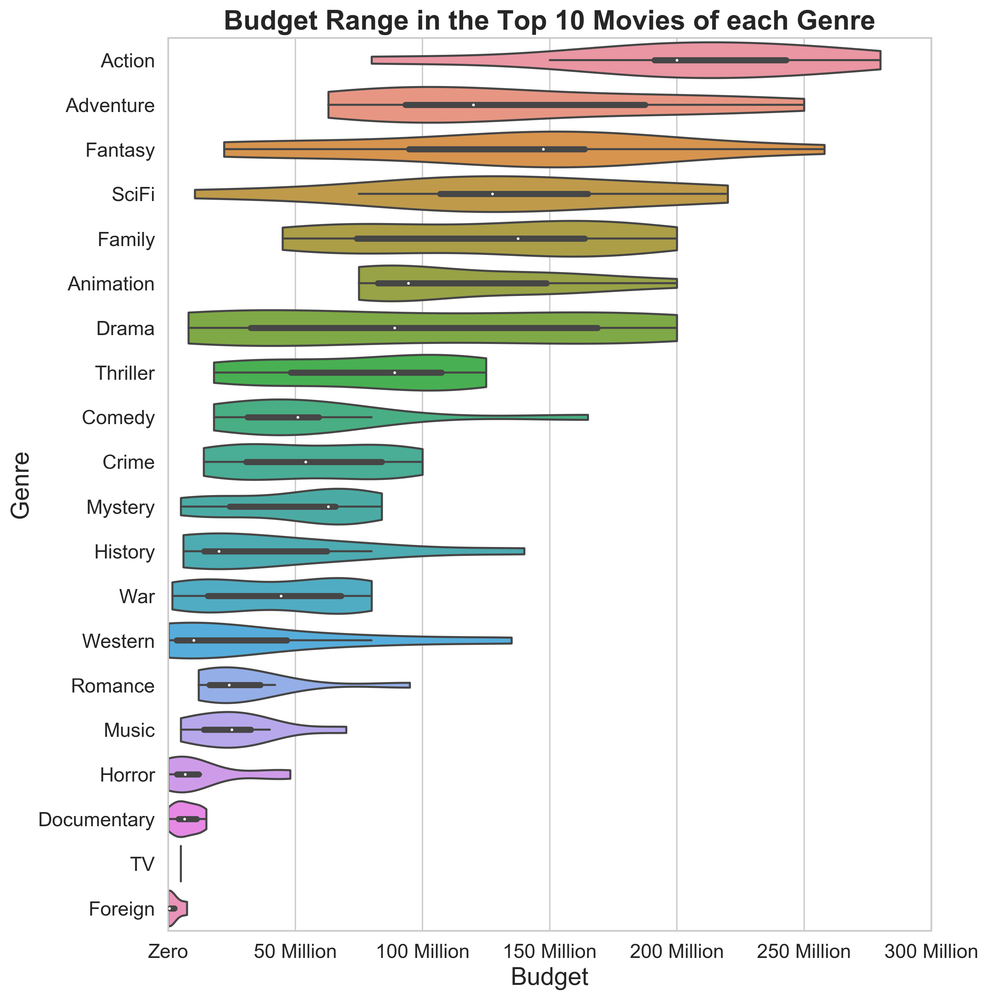

In [53]:
# draw a violinplot and split the violins for easier comparison
sb.set(style="whitegrid")
plt.figure(figsize=[10, 12])
plt.xlim(0,300000000)
plt.tick_params('y', labelsize='large')
plt.xticks([0, 50000000, 100000000, 150000000, 200000000, 250000000, 300000000],
           ["Zero","50 Million","100 Million","150 Million","200 Million","250 Million","300 Million"],size='large')

# Find the order
a = budg.sort_values([('budget', 'mean')], ascending=False).reset_index(drop=True)
my_order = a['genres']

# plot 
sb.violinplot(x="budget", y="genres", split=True, data=prevprod, scale="width", cut=0, order=my_order)
pltlab('Budget Range in the Top 10 Movies of each Genre','Budget','Genre')

In [54]:
# get max mean and min of budget for each genre
profg = prevprod.groupby(['genres']).agg({'profit':['max', 'mean','min']}).reset_index()

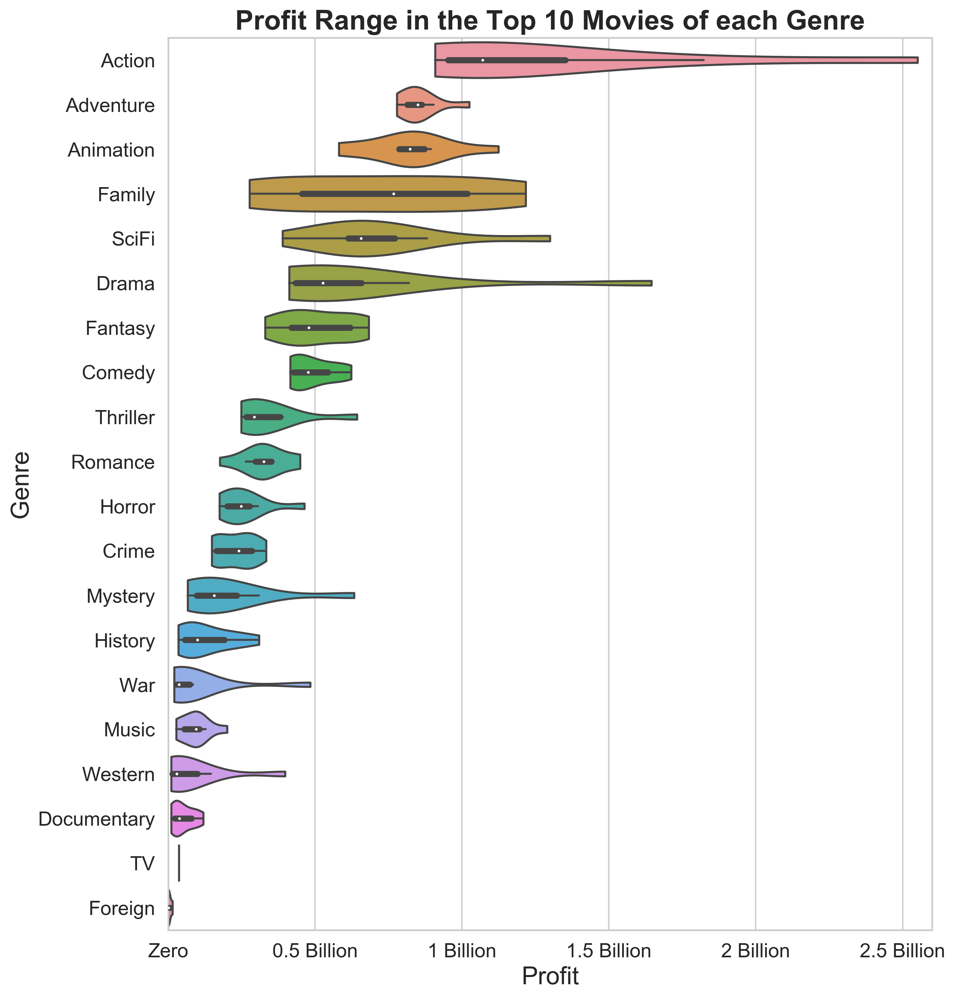

In [55]:
# draw a violinplot and split the violins for easier comparison
sb.set(style="whitegrid")
plt.figure(figsize=[10, 12])
plt.xlim(0,2600000000)
plt.tick_params('y', labelsize='large')
plt.xticks([0, 500000000, 1000000000, 1500000000, 2000000000, 2500000000],
           ["Zero","0.5 Billion","1 Billion","1.5 Billion","2 Billion","2.5 Billion"],size='large')

# Find the order
a = profg.sort_values([('profit', 'mean')], ascending=False).reset_index(drop=True)
my_order = a['genres']

# plot 
sb.violinplot(x="profit", y="genres", split=True, data=prevprod, scale="width", cut=0, order=my_order)
pltlab('Profit Range in the Top 10 Movies of each Genre','Profit','Genre')

In [71]:
a = prevprod.groupby(['genres'])['profit'].mean()
b = prevprod.groupby(['genres'])['budget'].mean()
c = a/b
print(b, a, c)

genres
Action         2.027000e+08
Adventure      1.369000e+08
Animation      1.155000e+08
Comedy         5.707200e+07
Crime          5.570000e+07
Documentary    7.138295e+06
Drama          9.790000e+07
Family         1.242000e+08
Fantasy        1.334000e+08
Foreign        2.099340e+06
History        4.280000e+07
Horror         1.317750e+07
Music          2.670000e+07
Mystery        5.000000e+07
Romance        3.130000e+07
SciFi          1.308500e+08
TV             5.000000e+06
Thriller       7.780000e+07
War            4.183500e+07
Western        3.209000e+07
Name: budget, dtype: float64 genres
Action         1.296095e+09
Adventure      8.554186e+08
Animation      8.168322e+08
Comedy         4.912167e+08
Crime          2.312582e+08
Documentary    5.100064e+07
Drama          6.476248e+08
Family         7.257484e+08
Fantasy        5.065031e+08
Foreign        4.298898e+06
History        1.273862e+08
Horror         2.583166e+08
Music          9.158106e+07
Mystery        2.039766e+08
Roman

In [72]:
b

genres
Action         2.027000e+08
Adventure      1.369000e+08
Animation      1.155000e+08
Comedy         5.707200e+07
Crime          5.570000e+07
Documentary    7.138295e+06
Drama          9.790000e+07
Family         1.242000e+08
Fantasy        1.334000e+08
Foreign        2.099340e+06
History        4.280000e+07
Horror         1.317750e+07
Music          2.670000e+07
Mystery        5.000000e+07
Romance        3.130000e+07
SciFi          1.308500e+08
TV             5.000000e+06
Thriller       7.780000e+07
War            4.183500e+07
Western        3.209000e+07
Name: budget, dtype: float64

In [57]:
c = c.sort_values(ascending=[True])

In [58]:
c

genres
Foreign         2.047737
War             2.227093
Western         2.546538
History         2.976313
Music           3.430002
Fantasy         3.796875
Mystery         4.079532
Crime           4.151853
Thriller        4.386149
SciFi           5.480616
Family          5.843385
Adventure       6.248492
Action          6.394152
Drama           6.615167
Animation       7.072140
Documentary     7.144653
TV              7.400000
Comedy          8.606964
Romance        10.507079
Horror         19.602850
dtype: float64

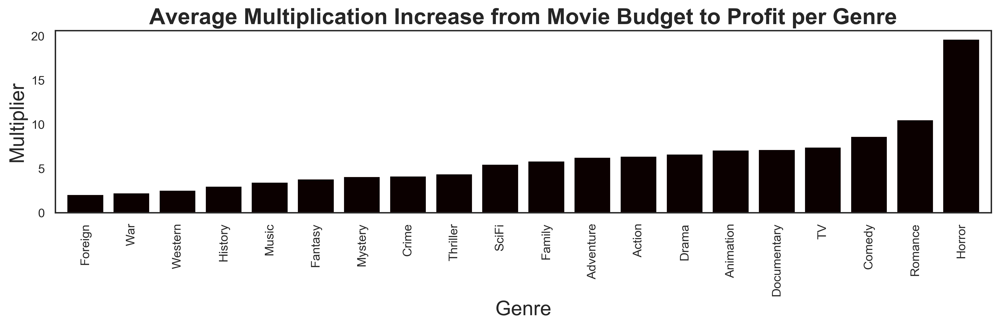

In [59]:
sb.set(style="white")
c.plot.bar(figsize=(15, 3), legend=None, cmap="hot", width=0.8)
pltlab('Average Multiplication Increase from Movie Budget to Profit per Genre','Genre','Multiplier')

### Prevailing month of release of each movie genre

Prevailing month of release of the 10 most profitable movies in each movie genre (Drama, Comedy, Thriller, Romance, Action, Horror, Documentary, Crime, Adventure, Science Fiction, Family, Mystery, Fantasy, Music, Animation, War, History, Western, TV Movie, Foreign)

In [60]:
# sort data
pp = prevprod[['genres','release_month']]
# apply month name
month = {1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun', 7:'Jul', 8:'Aug', 9:'Sep', 10:'Oct', 11:'Nov', 12:'Dec'}
pp['month'] = pp['release_month'].apply(month.get)
# group data
pp2 = pp.groupby(['month','genres']).size().unstack(fill_value=0).reset_index()
pp2['month'] = pd.Categorical(pp2['month'], ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
pp2 = pp2.sort_values('month')

C:\Apps\Continuum\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


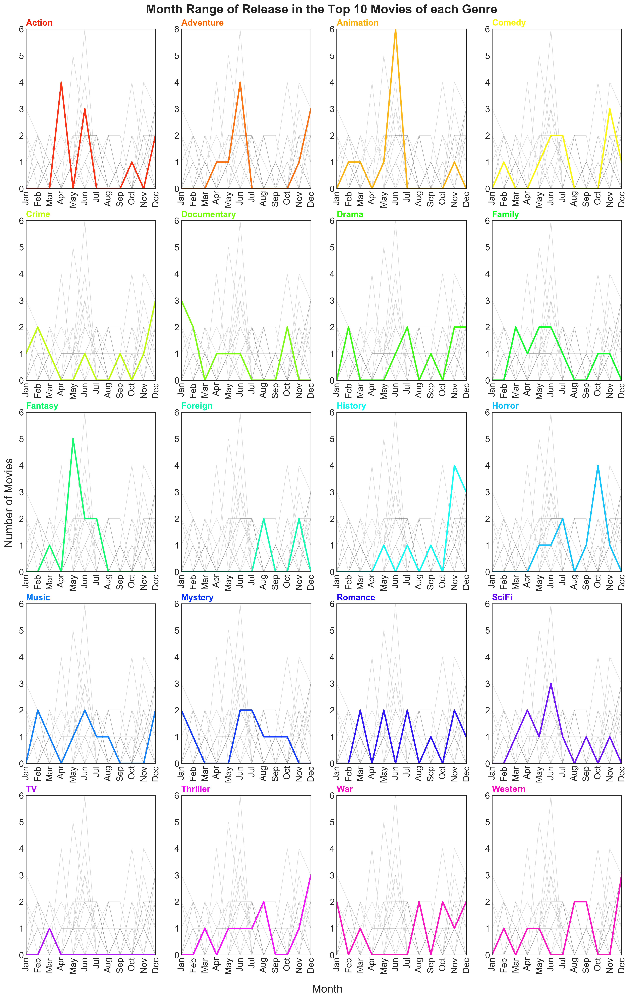

In [68]:
# plot results
plt.style.use('seaborn-white')
palette = plt.get_cmap('gist_rainbow', 20)
fig = plt.figure(figsize=(20, 14))


# multiple line plot
num=0
for column in pp2.drop('month', axis=1):
    num=num+1
    
    # Find the right spot on the plot
    plt.subplot(5,4, num)
    
    # plot every groups, but discreet
    for v in pp2.drop('month', axis=1):
        plt.plot(pp2['month'], pp2[v], marker='', color='grey', linewidth=0.6, alpha=0.3)
    
    # Plot the lineplot
    plt.plot(pp2['month'], pp2[column], marker='', color=palette(num), linewidth=2.4, alpha=0.9, label=column)

    # Not ticks everywhere
    #if num not in [17,18,19,20]:
    #    plt.xticks(pp2['month'], " ")
    #if num not in [1,5,9,13,17]:
    #    plt.yticks(pp2[column]," ")
    
    # Same limits for everybody!
    plt.ylim(0,6)
    plt.xlim(0,11)
    plt.tick_params('x', labelrotation=90, labelsize='large')
    plt.tick_params('y', labelsize='large')
    
    # Add title
    plt.title(column, loc='left', fontsize=14, fontweight='semibold', color=palette(num))
    
# general title
plt.suptitle("Month Range of Release in the Top 10 Movies of each Genre", fontsize=20, fontweight='semibold', x=0.46, y=1.64)
plt.subplots_adjust(bottom=0.1, right=0.8, top=1.6)

# Axis title
plt.text(-14,-1.3, 'Month', ha='center', va='center', fontsize=18)
plt.text(-41, 17, 'Number of Movies', ha='center', va='center', rotation='vertical', fontsize=18)

plt.show()

### Average run time of 10 most profitable movies in each genre

Average run time of 10 most profitable movies in each movie genre (Drama, Comedy, Thriller, Romance, Action, Horror, Documentary, Crime, Adventure, Science Fiction, Family, Mystery, Fantasy, Music, Animation, War, History, Western, TV Movie, Foreign)

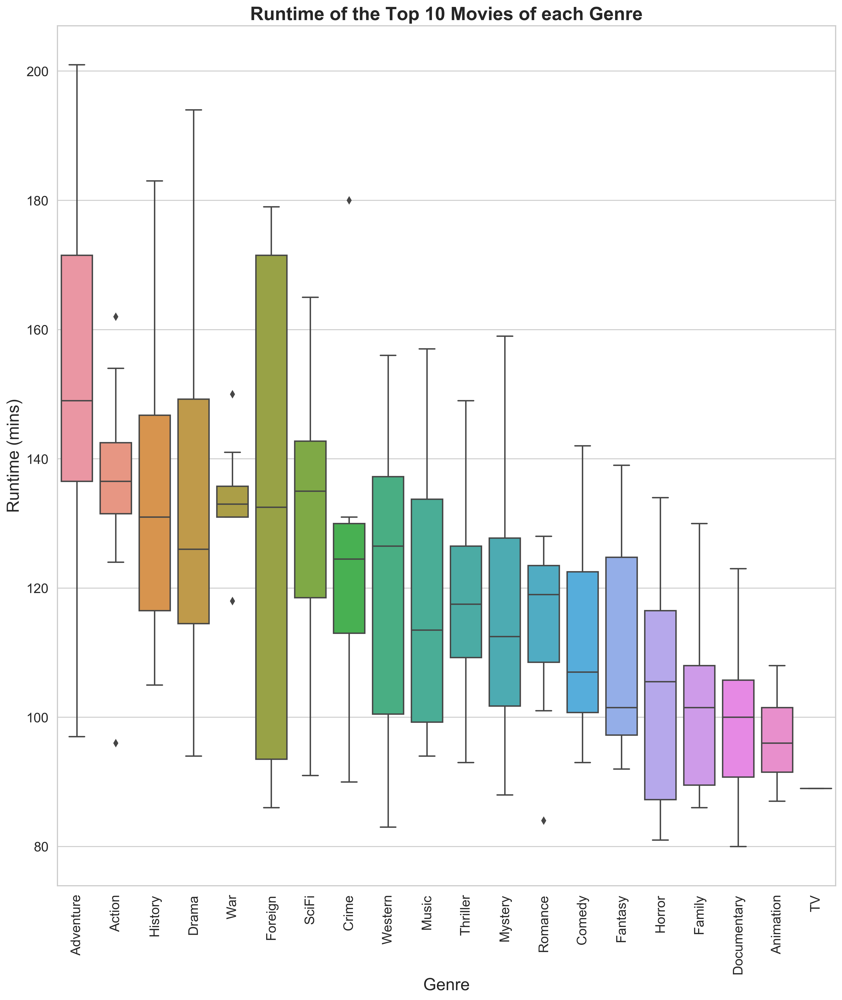

In [62]:
# draw a violinplot and split the violins for easier comparison
plt.figure(figsize=[15, 17])
sb.set(style="whitegrid")
plt.tick_params('x', labelrotation=90, labelsize='large')
plt.tick_params('y', labelsize='large')

# Find the order
b = prevprod.groupby(['genres']).mean()['runtime'].sort_values(ascending=False)
my_orderb = b.index

# plot
sb.boxplot(x='genres', y='runtime', data=prevprod, order=my_orderb)
pltlab('Runtime of the Top 10 Movies of each Genre','Genre','Runtime (mins)')

In [63]:
b

genres
Adventure      150.6
Action         135.9
History        135.1
Drama          133.7
War            132.6
Foreign        132.5
SciFi          131.6
Crime          125.1
Western        120.4
Music          118.5
Thriller       118.2
Mystery        116.9
Romance        114.6
Comedy         111.3
Fantasy        109.6
Horror         104.2
Family         103.3
Documentary    100.4
Animation       96.4
TV              89.0
Name: runtime, dtype: float64

In [64]:
c = prevprod.groupby(['genres']).std()['runtime'].sort_values(ascending=False)
c

genres
Foreign        48.266621
Drama          30.991217
Adventure      29.654305
History        24.442449
Western        24.185395
Crime          23.038374
Mystery        22.462067
Music          22.376823
SciFi          21.019568
Horror         18.683326
Action         17.810421
Fantasy        16.919417
Comedy         16.083463
Family         16.069640
Thriller       15.476147
Documentary    13.769532
Romance        13.753383
War             9.559172
Animation       6.915361
TV                   NaN
Name: runtime, dtype: float64

### Limitations and Biases

##### Profit calculation

In [65]:
total = len(mov)
budrev = 5381

In [66]:
df = pd.DataFrame({'Total': [45466],
                   'Budget_Revenue': [5381]})

In [67]:
plot = df.plot.pie(figsize=(5, 5))

ValueError: pie requires either y column or 'subplots=True'

##### Number of Genres

In [ ]:
# keep only first genre
movgr = movg['genres'].str.split("}", expand=True)

In [ ]:
movgr = movgr.replace(']', None)

In [ ]:
movgr.info()

In [ ]:
movgr[3].value_counts().sum()

In [ ]:
movgr

##### Number of Production Companies

In [ ]:
movpb

In [ ]:
movpb = movpb['production_companies'].str.split("}", expand=True)
movpb

In [ ]:
movpb = movpb.replace(']', None)
movpb.info()

##### count number of movies per genre

In [ ]:
prevprod.genres.value_counts()

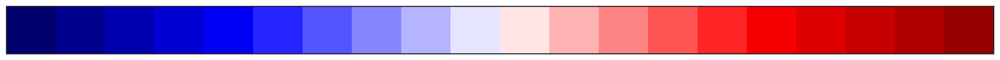

In [87]:
sb.palplot(sb.color_palette("seismic", 20))